## 4i

In [1]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import pysodb

In [3]:
sc.set_figure_params(vector_friendly=False,format='pdf',transparent=True,dpi=50)
plt.rcParams["figure.figsize"] = (8, 8)

sns.set_style('white')

#### load data using pysodb

In [4]:
sodb = pysodb.SODB() # Initialization

/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/urllib3-1.26.12-py3.9.egg/urllib3/connectionpool.py:1045: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gene.ai.tencent.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


In [ ]:
# this dataset is from publication "Multiplexed protein maps link subcellular organization to cellular states"

In [ ]:
# link in SODB: https://gene.ai.tencent.com/SpatialOmics/dataset?datasetID=62

In [7]:
adata = sodb.load_experiment('gut2018multiplexed','cell_129')
# the first parameter is the name of the dataset
# the second parameter is the name of one experiment in the dataset

download experiment[cell_129] in dataset[gut2018multiplexed]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14.9M/14.9M [00:04<00:00, 3.88MB/s]


load experiment[cell_129] in dataset[gut2018multiplexed] from /home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/pysodb-1.0.0-py3.9.egg/pysodb/cache/gut2018multiplexed/cell_129.h5ad


#### identify clusters

In [8]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/tqdm-4.64.1-py3.9.egg/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


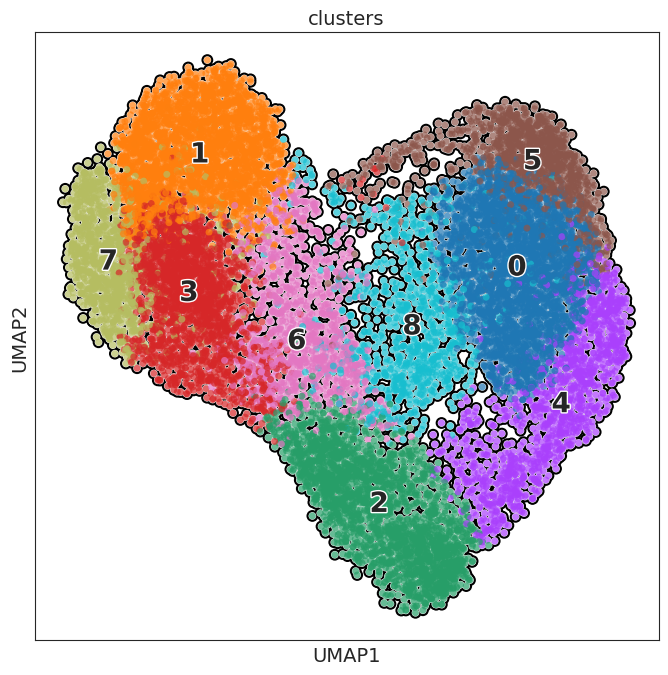

In [9]:
sc.pl.umap(adata, color=[ "clusters"], wspace=0.4,
          add_outline=True,legend_fontsize=20, legend_fontoutline=2,
            legend_loc='on data',
            s=100
          )

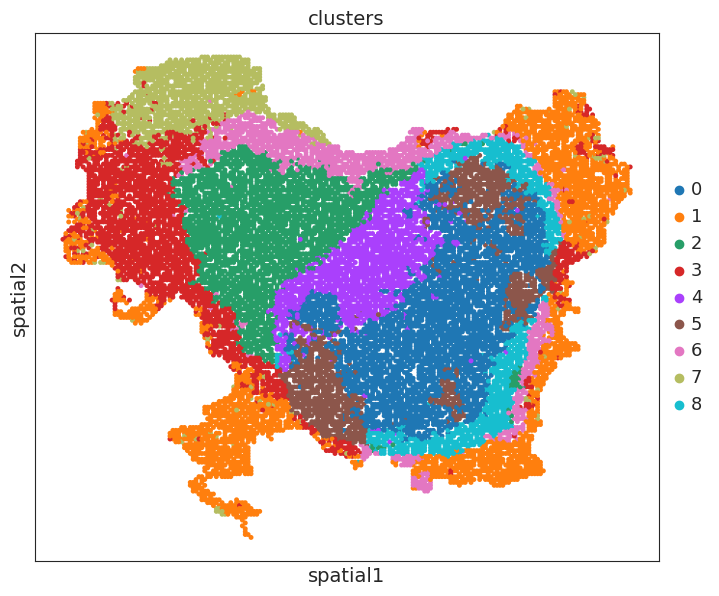

In [10]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=['clusters'],show=False,size=50,add_outline=False)
plt.gca().set_aspect('equal', adjustable='box')

#### marker gene detection

In [ ]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")


/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/scanpy-1.9.1-py3.9.egg/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


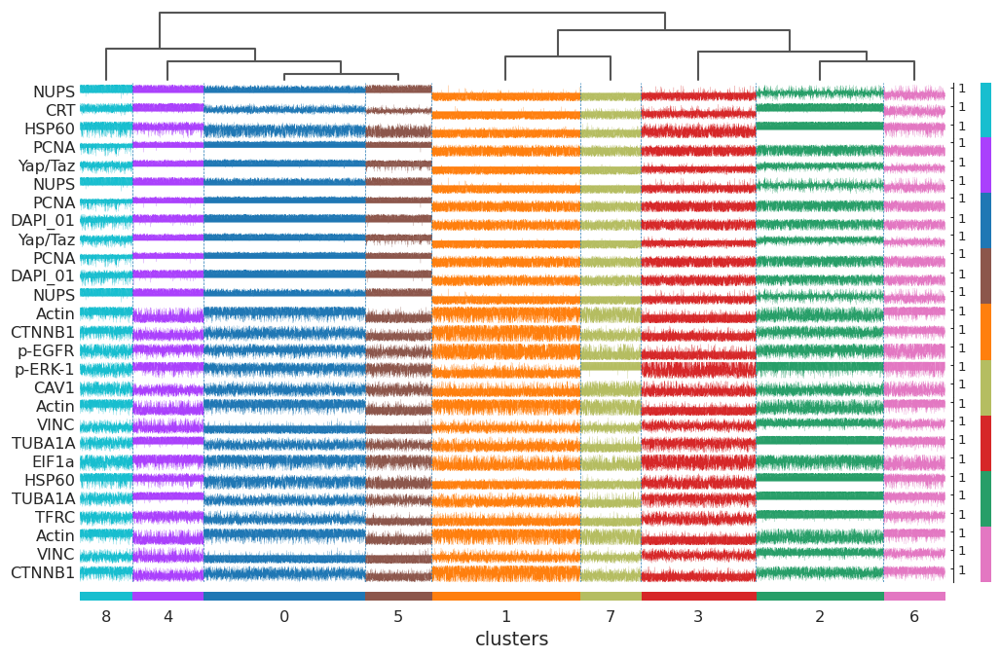

In [12]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=3, groupby="clusters")

In [13]:
adata

AnnData object with n_obs × n_vars = 15213 × 43
    obs: 'x', 'y', 'is_nucleous', 'is_cytplasm', 'cell_id', 'leiden', 'cluster', 'clusters'
    uns: 'cluster_colors', 'leiden', 'leiden_colors', 'moranI', 'neighbors', 'pca', 'rank_genes_groups', 'spatial_neighbors', 'umap', 'clusters_colors', 'dendrogram_clusters'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [14]:
marker_genes = adata.uns['rank_genes_groups']['names'][0]

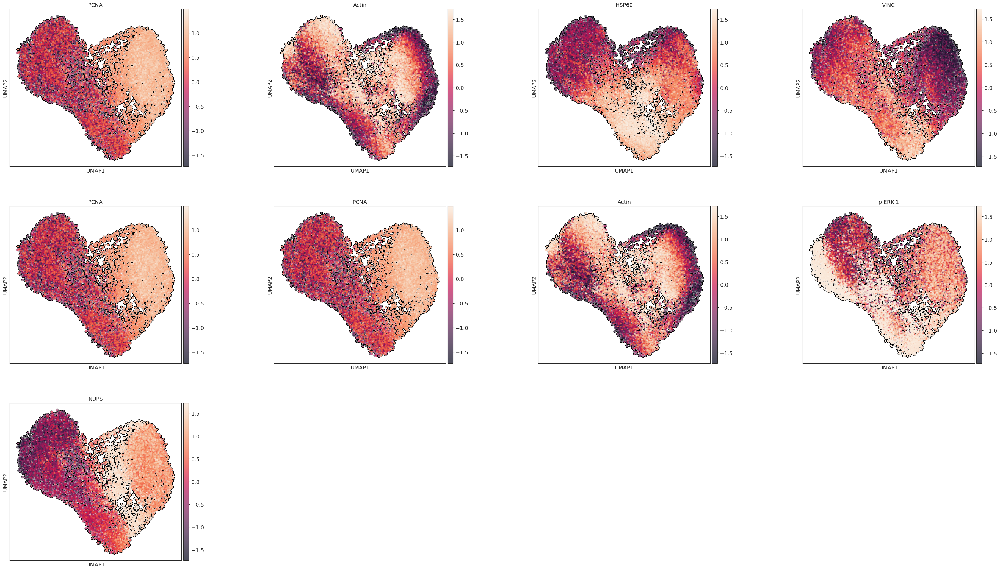

In [15]:
sc.pl.umap(adata, color=marker_genes, wspace=0.4,
          add_outline=True,legend_fontsize=10, legend_fontoutline=2,
            legend_loc='on data',
            s=80
          )

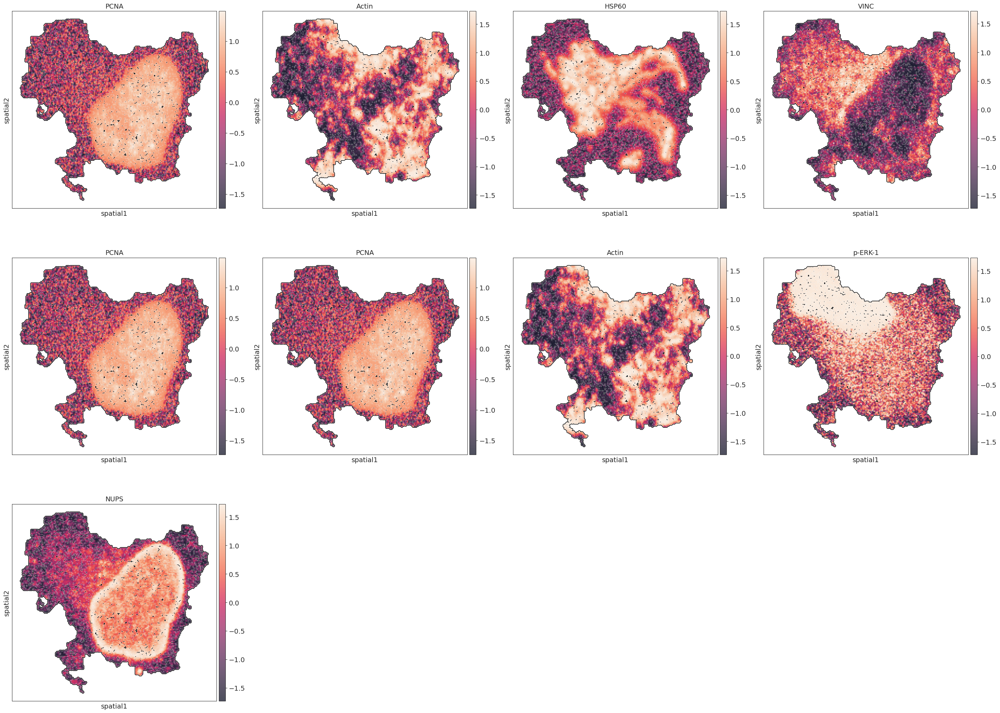

In [16]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=marker_genes,size=50,add_outline=True)
